# Unsupervised Learning - Project

In this Project, we are going to perform a full unsupervised learning machine learning project on a "Wholesale Data" dataset. The dataset refers to clients of a wholesale distributor. It includes the annual spending in monetary units (m.u.) on diverse product categories

[Kaggle Link](https://www.kaggle.com/datasets/binovi/wholesale-customers-data-set)

# Part I : EDA - Exploratory Data Analysis & Pre-processing

The given dataset seems to be a grocery sales dataset containing information about various products sold by a grocery store. To perform an exploratory data analysis (EDA) on this dataset, we can perform the following tasks:

- Data Import: Import the dataset into a statistical software tool such as Python or R.
- Data Cleaning: Check the dataset for any missing or incorrect data and clean the dataset accordingly. This may involve removing or imputing missing data or correcting any obvious errors.
Data Description: Generate summary statistics such as mean, median, and standard deviation for each column of the dataset. This will help in understanding the distribution of data in each column.
- Data Visualization: Create various visualizations such as histograms, box plots, scatter plots, and heatmaps to understand the relationships and trends between the different variables in the dataset. For example, we can create a scatter plot between the "Fresh" and "Milk" variables to see if there is any correlation between them.
- Outlier Detection: Check for any outliers in the dataset and determine whether they are valid or erroneous data points.
- Correlation Analysis: Calculate the correlation between different variables in the dataset to determine which variables are highly correlated and which ones are not. For example, we can calculate the correlation between "Grocery" and "Detergents_Paper" to see if there is any relationship between these two variables.
- Data Transformation: If necessary, transform the data by standardizing or normalizing the variables to make them comparable across different scales.
- Feature Selection: Identify the most important features or variables that contribute the most to the overall variance in the dataset. This can be done using various feature selection techniques such as principal component analysis (PCA) or random forest regression.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_validate
from scipy.stats import boxcox, shapiro, probplot
from scipy.cluster.hierarchy import dendrogram, linkage
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
df = pd.read_csv('Wholesale_Data.csv')

In [3]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


#### Let's check for null values, check the datatypes, and get a statistical summary 

In [4]:
df.isnull().sum()

Channel             0
Region              0
Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicassen          0
dtype: int64

There are no null values

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


We're dealing with only numerical data here.  However, both Channel and Region, while numerical in labelling, appear to be categorical data.  As such, we will replace these with a single label for each combination.  ie. Channel-Region = 2-3

In [6]:
df['Channel_Region'] = df['Channel'].astype(str) + '-' + df['Region'].astype(str)

In [7]:
df.drop(columns=['Channel','Region'], inplace=True)

In [8]:
df.describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


We can see that the data is not scaled and not normally distributed. We will explore these distributions further and employ some standardization and scaling before modelling.

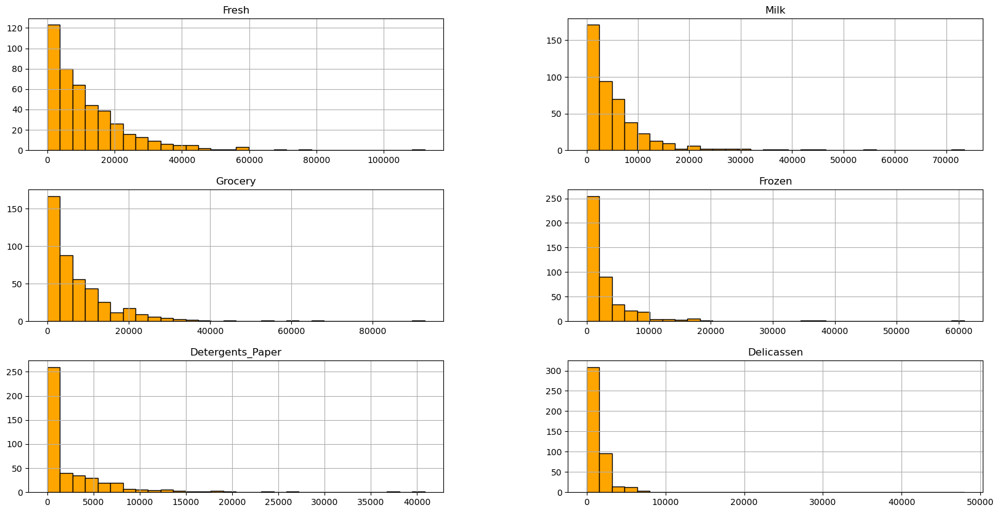

In [9]:
#Distribution of numeric variables

df.hist(figsize=(20,10),bins=30, color='orange', edgecolor='black')
plt.show()

As suspected, we can see that our data is not normally distributed and contain a significant number of outliers, which can have a detrimental impact on our analysis. This is particularly concerning because the K-Means is sensitive to the influence of extreme outliers, potentially leading to a significant bias in centroid estimation. We could mitigate this outlier issue by a K-Medians clustering algorithm instead, however, we will transform our data instead to eliminate the affects of these outliers.  In this scenario, we will employ a Box-Cox transformation in order to maintain the reality that the means of these product categories are quite different.

In [10]:
# Applying the Box-Cox transformation to each numerical column
transformed_data = df[list(df.columns[:-1])].apply(lambda col: boxcox(col)[0])

# Converting our transformed data back into a dataframe
df_trans = pd.DataFrame(transformed_data, columns=df.columns[:-1], index=df.index)

In [11]:
# I've included this block of code to try the PowerTransformer version of the box-cox method afterwards.  This does not maintain differing means, but
# It will normalized the data around 0.
"""
power_transformer = PowerTransformer(method='box-cox')
transformed_data = power_transformer.fit_transform(df)
df_trans = pd.DataFrame(transformed_data, columns=df.columns, index=df.index)
"""

"\npower_transformer = PowerTransformer(method='box-cox')\ntransformed_data = power_transformer.fit_transform(df)\ndf_trans = pd.DataFrame(transformed_data, columns=df.columns, index=df.index)\n"

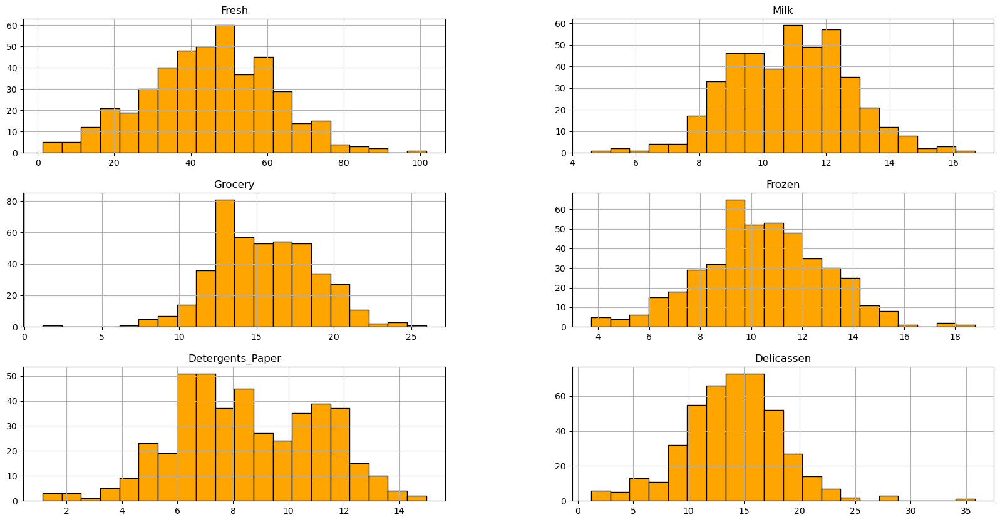

In [12]:
#Distribution of transformed data

df_trans.hist(figsize=(20,10),bins=20, color='orange', edgecolor='black')
plt.show()

These distributions are looking much more normal.  However, K-means is sensitive to the scale of your features, so we need to address this in order to ensure that each feature contributes equally to the clustering process.  We will go with a simple minmax scaler for this.

In [13]:
df_trans

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,51.736919,12.670296,16.694342,6.887991,10.154313,15.470232
1,42.989031,12.699553,17.444169,10.638490,10.494584,16.620941
2,41.571828,12.500943,16.745021,11.254315,10.602565,23.790243
3,52.490385,9.068054,14.932092,13.308825,7.587652,16.649068
4,62.025081,11.620137,16.540472,12.253988,9.499037,21.583731
...,...,...,...,...,...,...
435,67.509485,13.082824,19.168372,14.934483,6.131939,17.541051
436,73.578823,9.358068,10.462168,12.552512,5.226444,17.814282
437,54.015018,13.557444,21.453263,8.079721,13.088843,16.830525
438,48.453003,9.892812,13.150498,9.629617,6.022019,17.382819


In [14]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_trans)
df_scaled = pd.DataFrame(df_scaled, columns=df.columns[:-1])

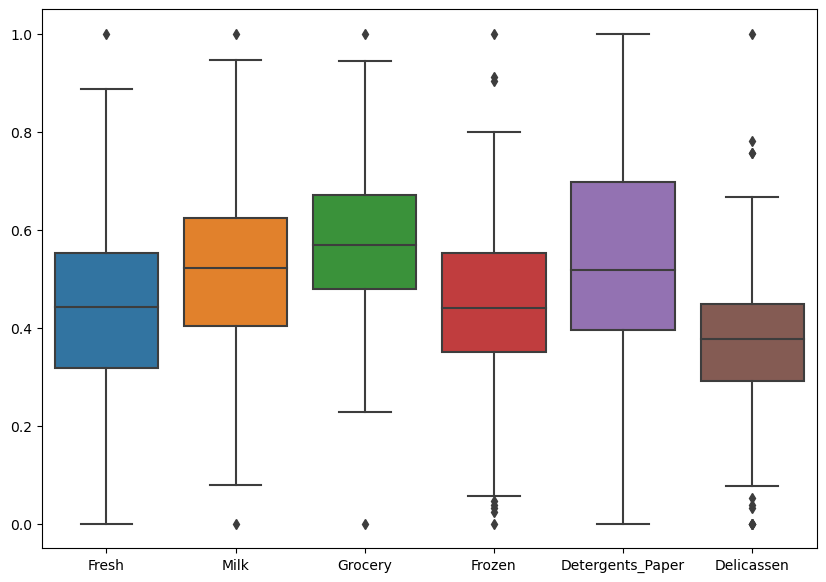

In [15]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df_scaled)
plt.show()

As previously noted, the presence of influential outliers can have a detrimental impact on the computation of cluster centers. Individual outliers may wield significant influence in determining the cluster means. To address this issue, we will relocate the outliers to a position that is 1.5 times the interquartile range away from either the first or third quartile.

In [16]:
df_scaled['Channel_Region']=df['Channel_Region']

In [17]:
df_scaled.iloc[:,:-1]

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.503006,0.667729,0.625853,0.209882,0.651772,0.412310
1,0.415768,0.670149,0.656101,0.459175,0.676366,0.445609
2,0.401635,0.653724,0.627898,0.500109,0.684170,0.653077
3,0.510520,0.369822,0.554765,0.636671,0.466264,0.446423
4,0.605605,0.580881,0.619646,0.566556,0.604411,0.589224
...,...,...,...,...,...,...
435,0.660299,0.701846,0.725654,0.744727,0.361050,0.472236
436,0.720826,0.393806,0.374452,0.586399,0.295604,0.480143
437,0.525725,0.741097,0.817825,0.289095,0.863870,0.451674
438,0.470257,0.438030,0.482897,0.392116,0.353105,0.467657


In [18]:
for i in df_scaled.columns[:-1]:
    # Calculating the interquartile range, Q1 and Q3 for the feature
    iqr = np.percentile(df_scaled[i], 75)-np.percentile(df_scaled[i], 25)
    q3 = np.percentile(df_scaled[i], 75)
    q1 = np.percentile(df_scaled[i], 25)
    
    # Removing all outliers that are 1.5*iqr away from Q1 and Q3
    df_scaled[i] = np.where(df_scaled[i] > q3 + 1.5*iqr, q3 + 1.5*iqr, df_scaled[i])
    df_scaled[i] = np.where(df_scaled[i] < q1 - 1.5*iqr, q1 - 1.5*iqr, df_scaled[i])

Let's check our boxplots out again to verify the outliers are gone:

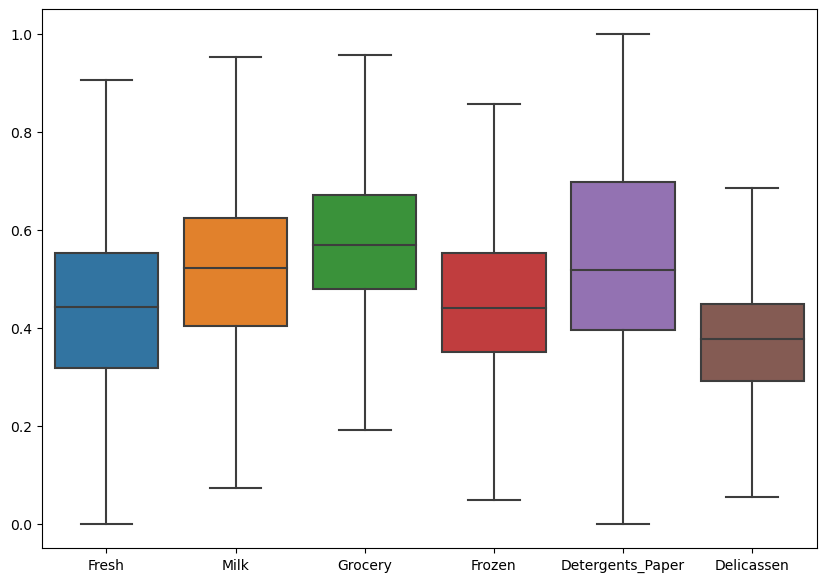

In [19]:
plt.figure(figsize=(10,7))
sns.boxplot(data=df_scaled.iloc[:,:-1])
plt.show()

They are indeed gone.

Let's now check normality by using Shapiro-Wilks test.  Here, we have operate with the null-hypothesis that the data is normal, so we want to see high p-values to validate this null-hypothesis for our features.

In [20]:
normality=pd.DataFrame(index=['p-value', 'test-statistic'])
for i in df_scaled.columns[:-1]:
    normality[i]=shapiro(df_scaled[i])
    
normality.T

,p-value,test-statistic
Fresh,0.997202,0.662730
Milk,0.996520,0.459561
Grocery,0.992466,0.025724
Frozen,0.995659,0.264255
Detergents_Paper,0.985208,0.000185
Delicassen,0.992554,0.027444


Here, we indeed have normally distributed data.

Finally, we move on to uncovering any existing correlation between features by using scatterplots and heatmaps.

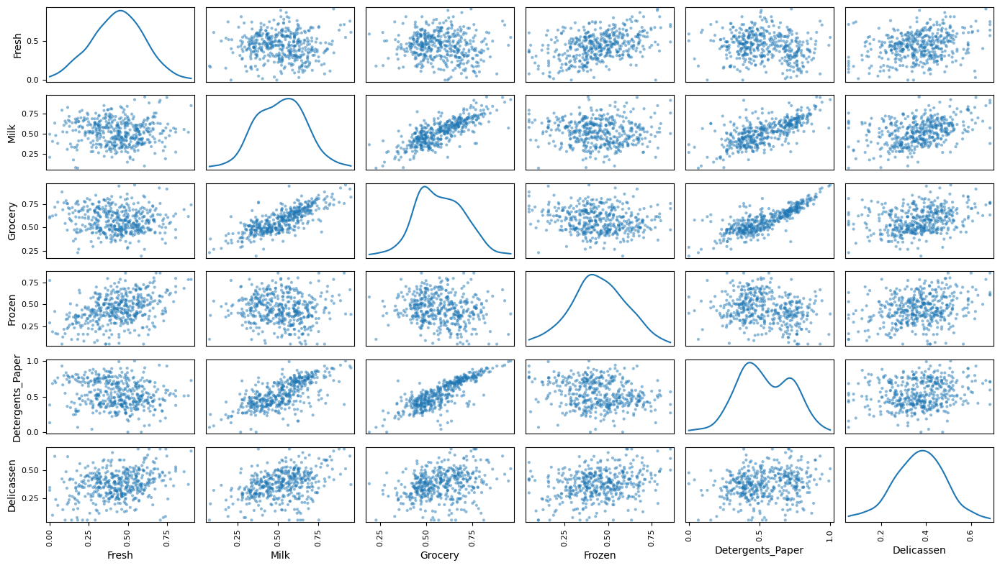

In [21]:
# Produce a scatter matrix for each pair of newly-transformed features
pd.plotting.scatter_matrix(df_scaled, figsize=(14,8),diagonal='kde')
plt.tight_layout()

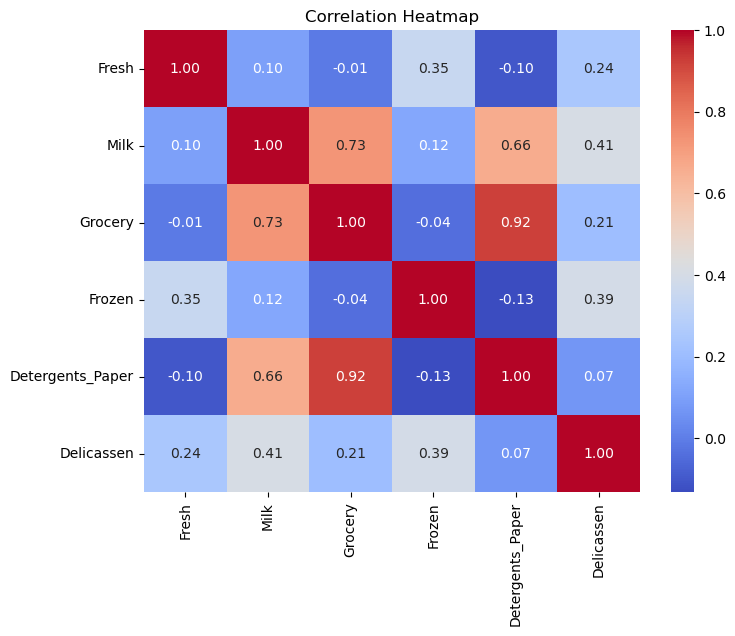

In [22]:
# Calculate the correlation matrix of our original feature values
corr_matrix = df.iloc[:,:-1].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

We can see that there is a postive correlation between a few of our features, the strongest of which is between 'Grocery' and 'Detergents_Paper', with a correlation of 0.92.  We can also see some weaker, bust still noteable correlations between 'Milk' and 'Grocery' at 0.73 and between 'Milk' and 'Detergents_Paper' at 0.66.
Milk seems to have a positive (albeit mostly weak) correlation between all of the other features, so this may prove to be an important feature.  This is not much of a surprise since Milk is often a common household staple in most homes, and it therefore likely bought more often and with other items.

Let us now move along to our unsupervised modeling.

In [23]:
X=df_scaled.iloc[:,:-1]

# Part II - KMeans Clustering

The objective of the analysis is to group similar products together into clusters based on their attributes such as fresh, milk, grocery, frozen, detergents_paper, and delicatessen. To perform the k-means clustering analysis, you will need to pre-process the dataset, determine the optimal number of clusters, initialize the centroids, assign data points to clusters, update the centroids, and repeat until convergence.

**Objective:** We need to determine how many clusters we should choose (ie. the "best" number of clusters). We will achieve this by using the "Elbow Rule" after plotting the distortion/inertia for various number of clusters to tell us how far away the points within a cluster are to one another.  We will examine this distance between 1 and 10 clusters.

In [24]:
def plot_distortion(X,max_clusters = 10):
    distortions = []
    for i in range(1, max_clusters +1):
        km = KMeans(n_clusters=i,
                    init='k-means++',
                    n_init=10,
                    random_state=0)
        km.fit(X)
        distortions.append(km.inertia_)
        
    plt.plot(range(1,max_clusters +1), distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show()

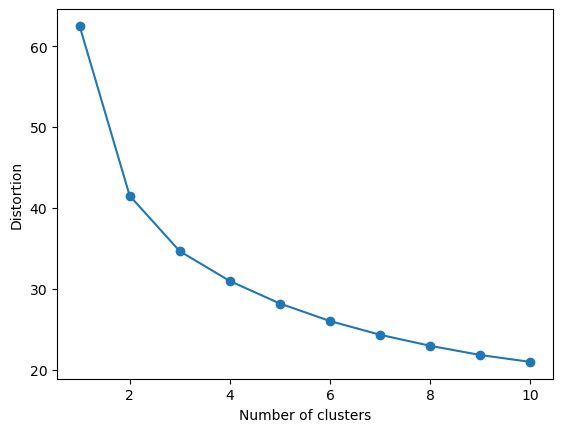

In [25]:
# elbow rule
plot_distortion(X,max_clusters=10)

It's tough to tell where the elbow is, but it appears that it's at k=2.  We may be fine to choose a k between 2 and 4.  Let's calculate the silhouette score for different numbers of clusters. The silhouette score measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). A higher silhouette score indicates better-defined clusters.

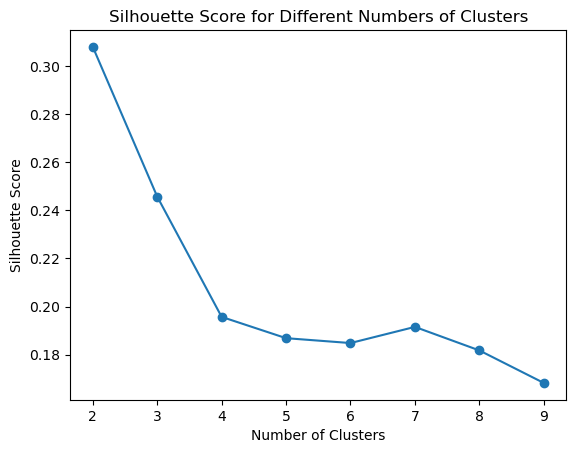

In [26]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

silhouette_scores = []
cluster_range = range(2, 10)

for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(X)
    labels = kmeans.labels_
    silhouette_scores.append(silhouette_score(X, labels))

# Plot silhouette scores
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.show()

The silhouette score is maximized when k=2.  However, we could likely get away with using 3 or 4 clusters as well.

Let's fit the model with 2 and 4 clusters and graph a few scatterplots with the clusters as our labelling.

In [27]:
# K-means with 2 clusters

X_y_kmeans2 = X.copy()
kmeans=KMeans(init='k-means++' , n_clusters=2, random_state=0)
cluster_model=kmeans.fit(X)
X_y_kmeans2['Cluster']=cluster_model.predict(X).astype('str')

In [28]:
# value counts per cluster
X_y_kmeans2['Cluster'].value_counts()

Cluster
0    259
1    181
Name: count, dtype: int64

In [29]:
# Define a function to plot clusters
def plot_clusters(data, cluster_col, x_col, y_col):
    unique_clusters = data[cluster_col].unique()
    plt.figure(figsize=(4, 3))
    for cluster in unique_clusters:
        cluster_data = data[data[cluster_col] == cluster]
        plt.scatter(cluster_data[x_col], cluster_data[y_col], label=f'Cluster {cluster}')
    plt.title('Clusters')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend()
    plt.grid(True)
    plt.show()

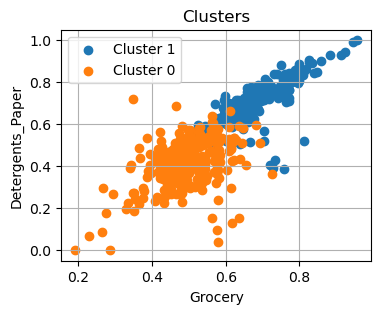

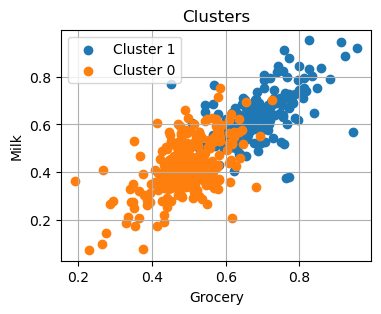

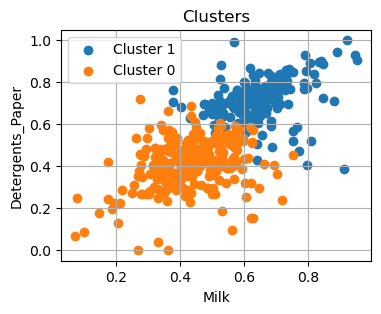

In [30]:
# Use the plot_clusters function to visualize the clusters
plot_clusters(X_y_kmeans2, 'Cluster', 'Grocery', 'Detergents_Paper')
plot_clusters(X_y_kmeans2, 'Cluster', 'Grocery', 'Milk')
plot_clusters(X_y_kmeans2, 'Cluster', 'Milk', 'Detergents_Paper')

In [31]:
# K-Means with 4 clusters

X_y_kmeans4 = X.copy()
kmeans=KMeans(init='k-means++' , n_clusters=4, random_state=0)
cluster_model=kmeans.fit(X)
X_y_kmeans4['Cluster']=cluster_model.predict(X).astype('str')

In [32]:
# Value Counts per Cluster
X_y_kmeans4['Cluster'].value_counts()

Cluster
1    155
0    106
3     96
2     83
Name: count, dtype: int64

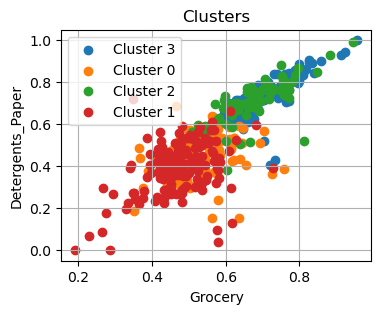

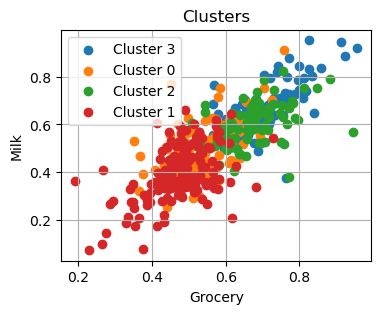

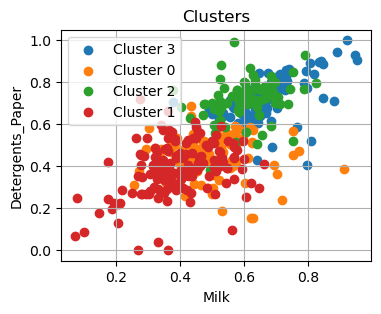

In [33]:
# Use the plot_clusters function to visualize the clusters
plot_clusters(X_y_kmeans4, 'Cluster', 'Grocery', 'Detergents_Paper')
plot_clusters(X_y_kmeans4, 'Cluster', 'Grocery', 'Milk')
plot_clusters(X_y_kmeans4, 'Cluster', 'Milk', 'Detergents_Paper')

Given 2 dimensional plots, without using any dimensionality reduction, it is difficult to see if our data can be naturally separated into 4 clusters.  The plots the 2-cluster KMeans are easier to "see" whether there is a distinct/clear separation between the clusters without dimensionality reduction.

# Part III - Hierarchical Clustering 

Hierarchical clustering is a popular unsupervised machine learning algorithm that is used to identify patterns and group similar data points together in a hierarchy. The algorithm works by iteratively merging or splitting clusters based on a similarity measure until a dendrogram is formed.

To perform hierarchical clustering analysis, you will need to pre-process the dataset, determine the optimal number of clusters using techniques such as dendrogram.

In [34]:
def plot_dendrogram(X, ed1, ed2, ed3, method ='ward'):
    dendrogram(linkage(X, method=method), truncate_mode='level', p=4)
    plt.axhline(y=ed1, label='threshold', linestyle="--", color='red', lw=1)
    plt.axhline(y=ed2, label='threshold', linestyle="--", color='red', lw=1)
    plt.axhline(y=ed3, label='threshold', linestyle="--", color='red', lw=1)
    plt.title("Dendrogram")
    plt.ylabel("Euclidean distances")
    plt.xlabel('Points')
    plt.show()

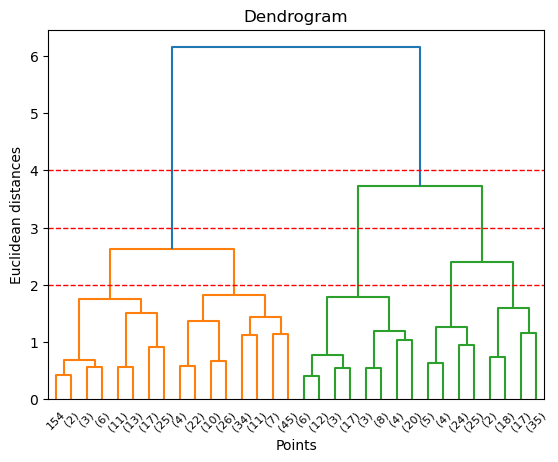

In [35]:
plot_dendrogram(X, 2, 3, 4)

To understand the dendrogram, I added two red lines which depict situations when we'd have 2 or 3 or 5 clusters (by counting the number of vertical lines passing through the red lines).  The numbers in parenthesis are numbers of observations per branch.  I've truncated these lower subdivisions in order for ease of viewing.

Let's compare these results to what we'd observe if we were using the complete, average, and single methods for the dendrogram.

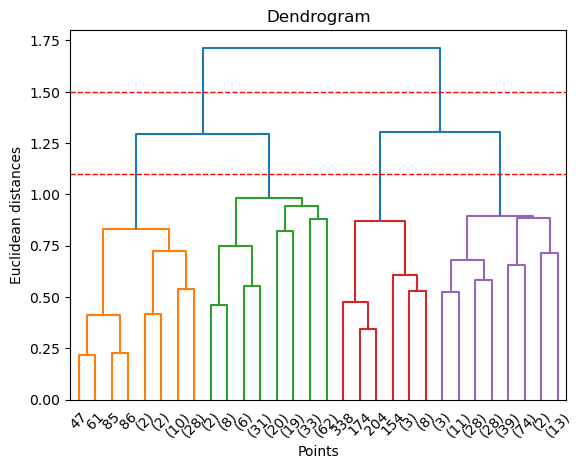

In [36]:
# Complete
plot_dendrogram(X, 1.1, 1.5, 3, method='complete')

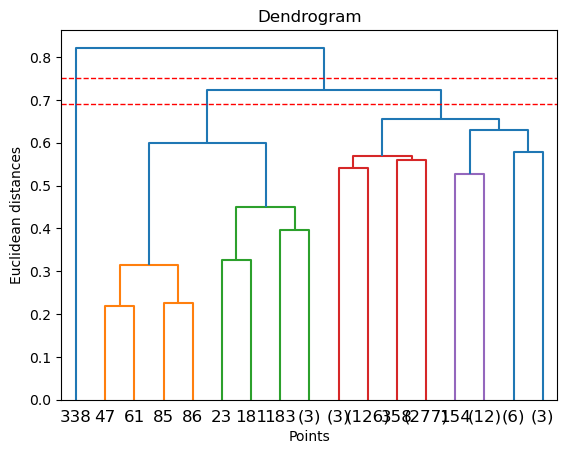

In [37]:
# Average
plot_dendrogram(X, 0.69, 0.75, 1.0, method='average')

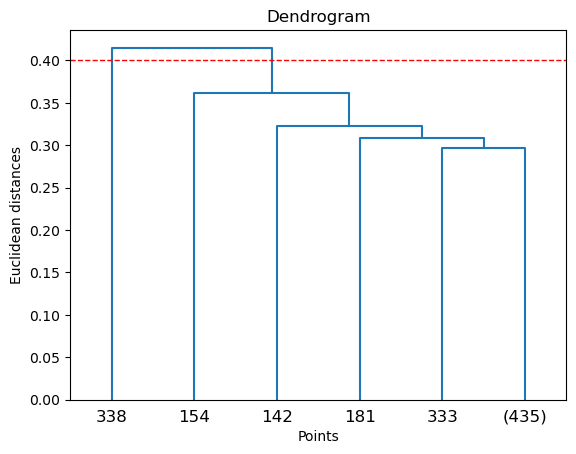

In [38]:
# Single
plot_dendrogram(X, 0.4, 0.5, 0.6, method='single')

When looking up when to use which method for dendrograms, I found that "single linkage is fast, and can perform well on non-globular data, but it performs poorly in the presence of noise. Average and complete linkage perform well on cleanly separated globular clusters, but have mixed results otherwise. Ward is the most effective method for noisy data."  Given that we don't necessarily have cleanly separated globular clusters, using average and complete may not be the best approach, but the complete method does seem to suggest 2, 3, or 4 clusters might be appropriate.  This agrees with the ward method.

So let's go ahead and train our hierarchical model with n_clusters = 2, 3, or 4 clusters, using both ward and complete methods.  We'll graph the clusters as well with all possible feature pairs, to see how well (or not) our separation is.

#### 1. Method: Ward, Clusters: 2

In [39]:
ac = AgglomerativeClustering(metric='euclidean', linkage='ward', n_clusters=2)
y_hc_w2 = ac.fit_predict(X)

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


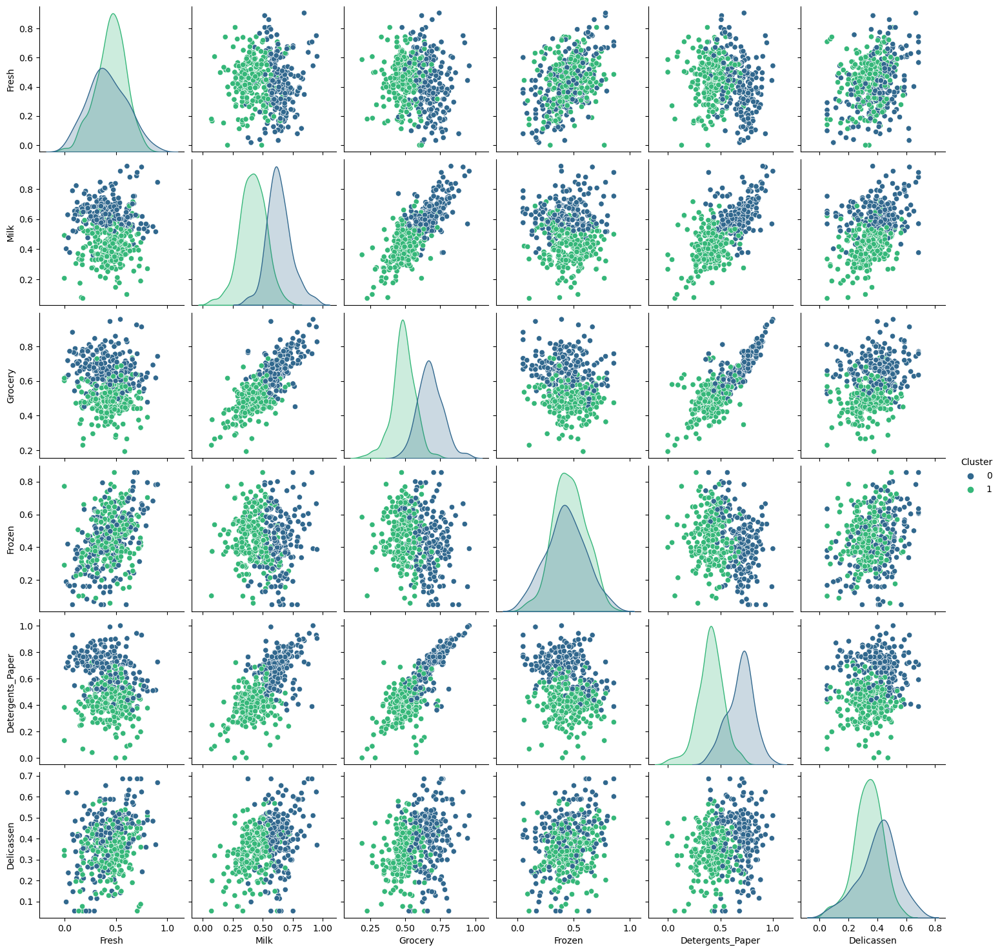

In [40]:
X_y = X.copy()
# Add cluster labels to DataFrame
X_y['Cluster'] = y_hc_w2

# Create a scatterplot matrix colored by cluster
sns.pairplot(X_y, hue='Cluster', palette='viridis')
plt.show()

#### 2. Method: Ward, Clusters: 3

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


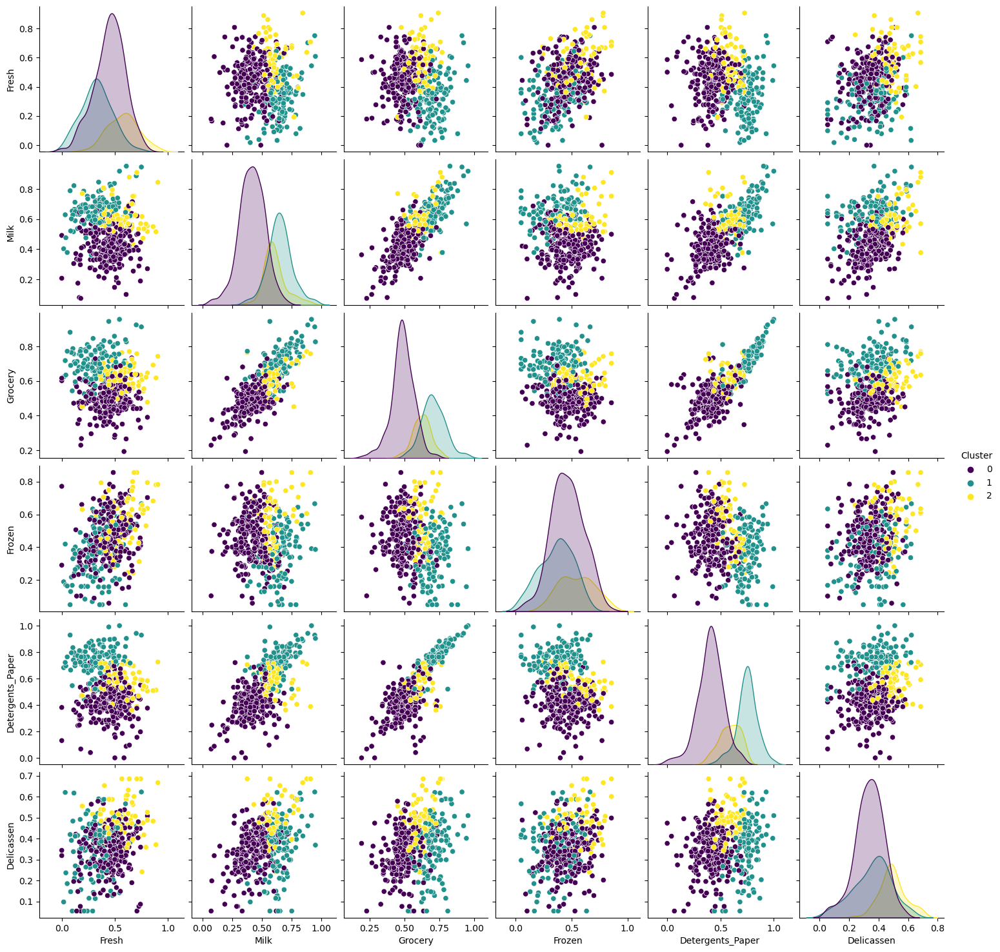

In [41]:
ac = AgglomerativeClustering(metric='euclidean', linkage='ward', n_clusters=3)
y_hc_w3 = ac.fit_predict(X)

X_y = X.copy()
# Add cluster labels to DataFrame
X_y['Cluster'] = y_hc_w3

# Create a scatterplot matrix colored by cluster
sns.pairplot(X_y, hue='Cluster', palette='viridis')
plt.show()

#### 3. Method: Complete, Clusters: 2

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


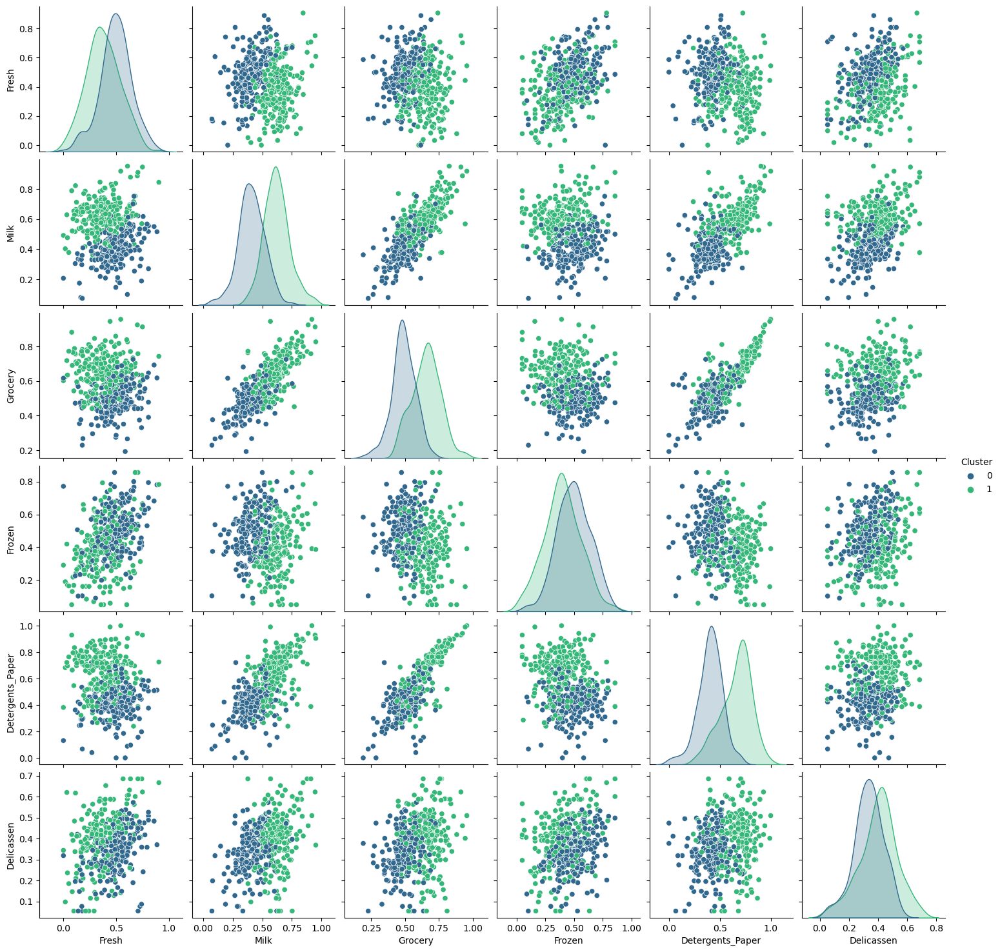

In [42]:
ac = AgglomerativeClustering(metric='euclidean', linkage='complete', n_clusters=2)
y_hc_c2 = ac.fit_predict(X)

X_y = X.copy()
# Add cluster labels to DataFrame
X_y['Cluster'] = y_hc_c2

# Create a scatterplot matrix colored by cluster
sns.pairplot(X_y, hue='Cluster', palette='viridis')
plt.show()

#### 4. Method: Complete, Clusters: 4

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


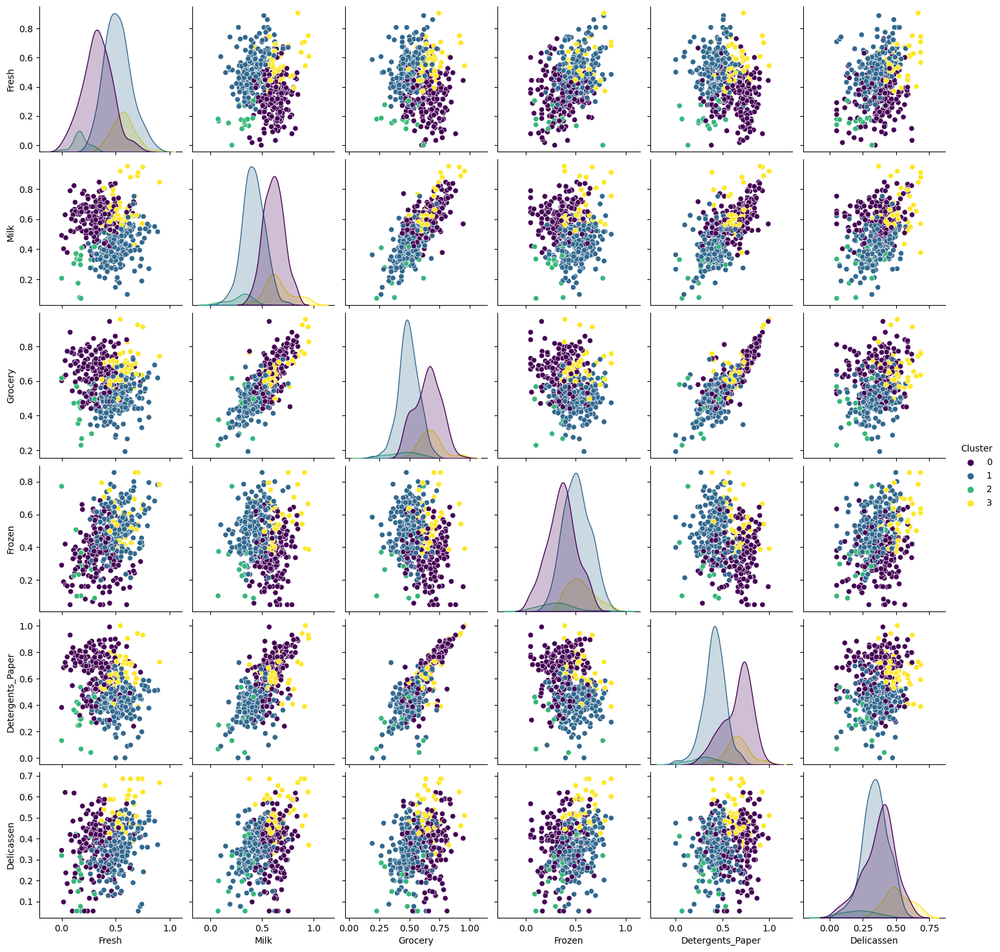

In [43]:
ac = AgglomerativeClustering(metric='euclidean', linkage='complete', n_clusters=4)
y_hc_c4 = ac.fit_predict(X)

X_y = X.copy()
# Add cluster labels to DataFrame
X_y['Cluster'] = y_hc_c4

# Create a scatterplot matrix colored by cluster
sns.pairplot(X_y, hue='Cluster', palette='viridis')
plt.show()

Given that these points on each scatterplot between features are not very well separated to begin with (at least not in 2 dimensions), the hirarchical algorithm seems to do a mediocre job at creating distinct clusters (either 2 or 3).  It does seem that the "ward" method was slightly better at clustering the points than the "complete" method, particularly when using n_clusters = 2.

Let's, for the sake of curiosity, see what the cluster separation looks like in 3D, with our three more strongly correlated features ("Milk", "Grocery", and "Detergents_Paper") as our axes.  We will only use the models with linkage = 'complete' and n_clusters = 4 and with linkage = 'ward' and n_clusters = 2 since these produced the clearest denrograms.

In [44]:
# Create a DataFrame with cluster labels
df_clustered_w2 = X.copy()
df_clustered_w2['Cluster'] = y_hc_w2

# Create an interactive 3D scatter plot
fig = px.scatter_3d(df_clustered_w2, x='Milk', y='Detergents_Paper', z='Grocery', color='Cluster',
                    symbol='Cluster', size_max=8, opacity=0.7, title='Clustering Results in 3D')

fig.update_layout(width=800, height=800, legend=dict(x=0, y=1, traceorder='normal', orientation='h'))


# Show the plot
fig.show()

Seems to be some decent separation between the two clusters.

In [45]:
# Create a DataFrame with cluster labels
df_clustered_c4 = X.copy()
df_clustered_c4['Cluster'] = y_hc_c4

# Create an interactive 3D scatter plot
fig = px.scatter_3d(df_clustered_c4, x='Milk', y='Detergents_Paper', z='Grocery', color='Cluster',
                    symbol='Cluster', size_max=8, opacity=0.7, title='Clustering Results in 3D')

fig.update_layout(width=800, height=800, legend=dict(x=0, y=1, traceorder='normal', orientation='h'))


# Show the plot
fig.show()

At first glance, there doesn't seem to be a very good separation between our clusters.  However, if we toggle the individual clusters, we can see there is a farily clear and distinct separation between particulary pairs of clusters.  You can toggle the different clusters by clicking on the cluster symbols represented in the legend.

These results do agree with the results from the k-means clustering which suggested that 2 clusters was likely the best k-means, but we could also choose up to 4 clusters.

Now, on to PCA!

# Part IV - PCA

In this section you are going to perform principal component analysis (PCA) to draw conclusions about the underlying structure of the wholesale customer data. Since using PCA on a dataset calculates the dimensions which best maximize variance, we will find which compound combinations of features best describe customers.

In [46]:
pca=PCA(n_components=len(X.columns))
pca.fit(X)
pca.explained_variance_ratio_

array([0.46618808, 0.2758752 , 0.11061654, 0.0764504 , 0.04981764,
       0.02105215])

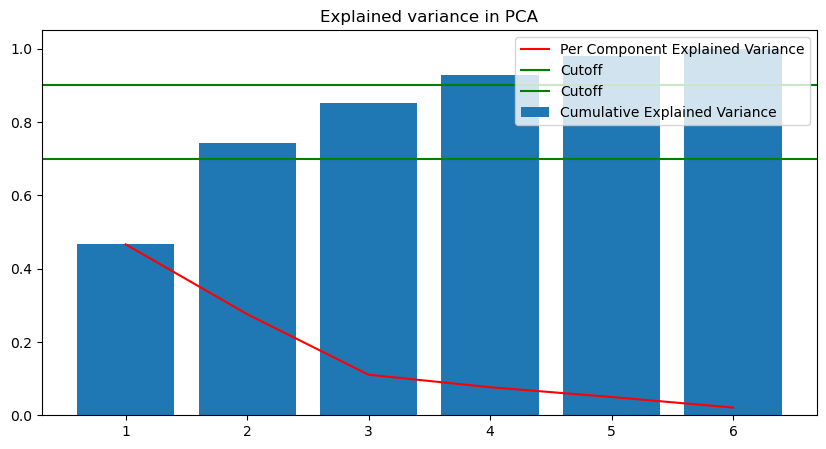

In [47]:
plt.figure(figsize=(10,5))
plt.plot(range(1,7),pca.explained_variance_ratio_, c='red', label='Per Component Explained Variance')
plt.bar(range(1,7), height=np.cumsum(pca.explained_variance_ratio_), label='Cumulative Explained Variance')
plt.axhline(y=0.7, c='g', label='Cutoff')
plt.axhline(y=0.9, c='g', label='Cutoff')
plt.title('Explained variance in PCA')
plt.xticks(range(1,7))
plt.legend(loc=1)
plt.show()

We can see that at least 70% of explained variability is reached when we use 2 components, and 90% of explained variability reached when we use 4 components. Therefore we will implement PCA dimensionality reduction to both 2 and 4 components.  Then we'll use the clustering resuts from a handful of our clustering models from above.  Particularly,
- Hierarchical Model with 4 clusters, using the "complete" method
- Hierarchical Model with 2 clusters, using the "ward" method
- KMeans model with 4 clusters
- KMeans model with 2 clusters

#### 1. Heirarchical(Linkage="complete",n_clusters=4) + PCA(n_components=4)

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



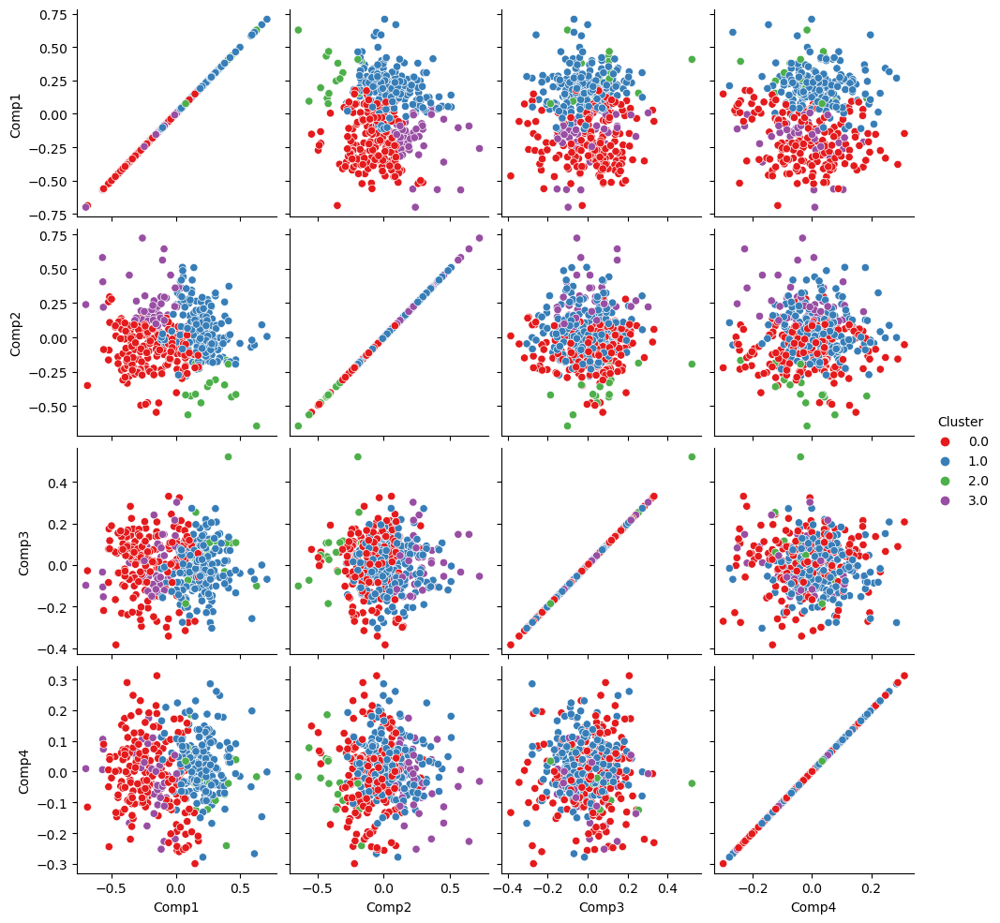

In [48]:
pca=PCA(n_components=4)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, df_clustered_c4.Cluster]), columns=['Comp1','Comp2','Comp3','Comp4','Cluster'])

sns.pairplot(reduced, hue='Cluster', diag_kind=None, vars=reduced.columns[0:-1], palette='Set1')
plt.show()

#### 2. Heirarchical(Linkage="complete",n_clusters=4) + PCA(n_components=2)

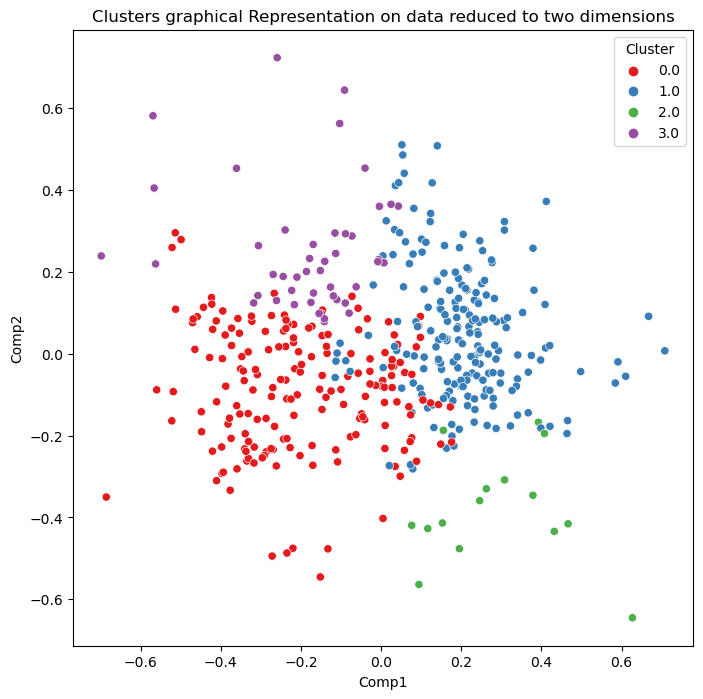

In [49]:
pca=PCA(n_components=2)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, df_clustered_c4.Cluster]), columns=['Comp1','Comp2','Cluster'])

plt.figure(figsize=(8,8))
sns.scatterplot(data=reduced, hue='Cluster', x='Comp1',y='Comp2', palette='Set1')
plt.title('Clusters graphical Representation on data reduced to two dimensions',  fontsize=12)
plt.show()

#### 3. Heirarchical(Linkage="ward",n_clusters=2) + PCA(n_components=4)

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



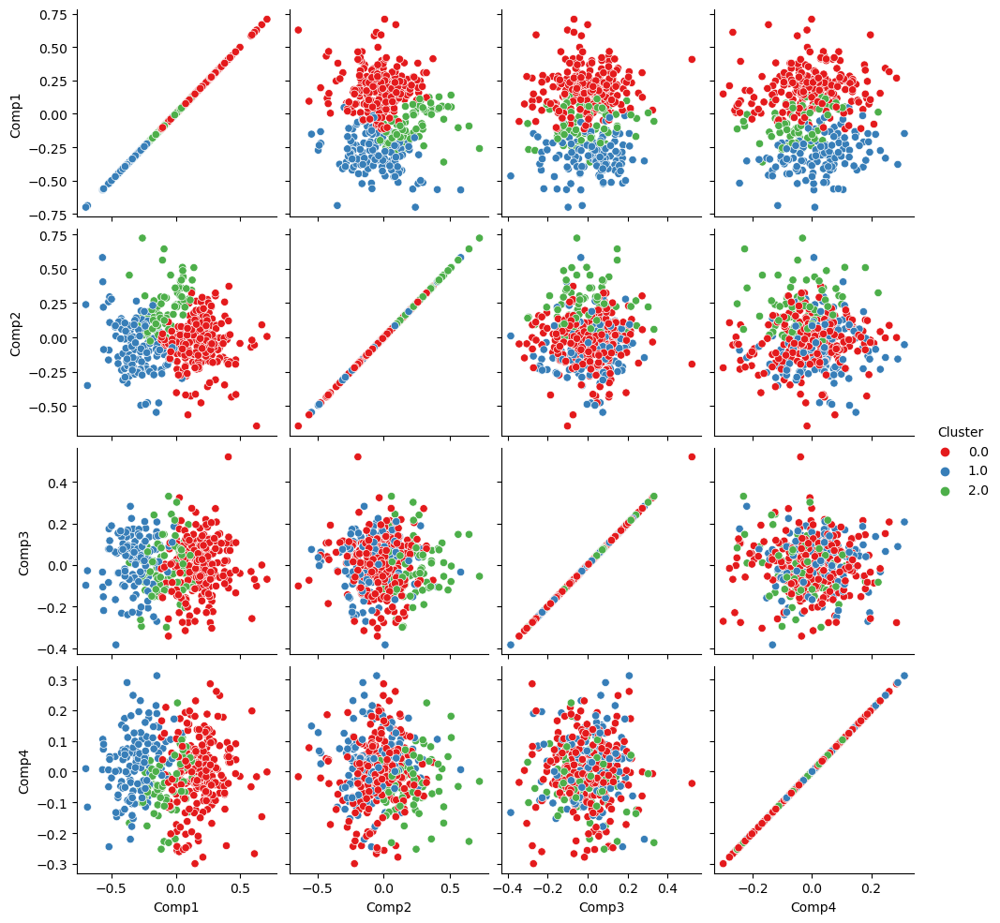

In [50]:
pca=PCA(n_components=4)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, y_hc_w3]), columns=['Comp1','Comp2','Comp3', 'Comp4', 'Cluster'])

sns.pairplot(reduced, hue='Cluster', diag_kind=None, vars=reduced.columns[0:-1], palette='Set1')
plt.show()

#### 4. Heirarchical(Linkage="ward",n_clusters=2) + PCA(n_components=2)

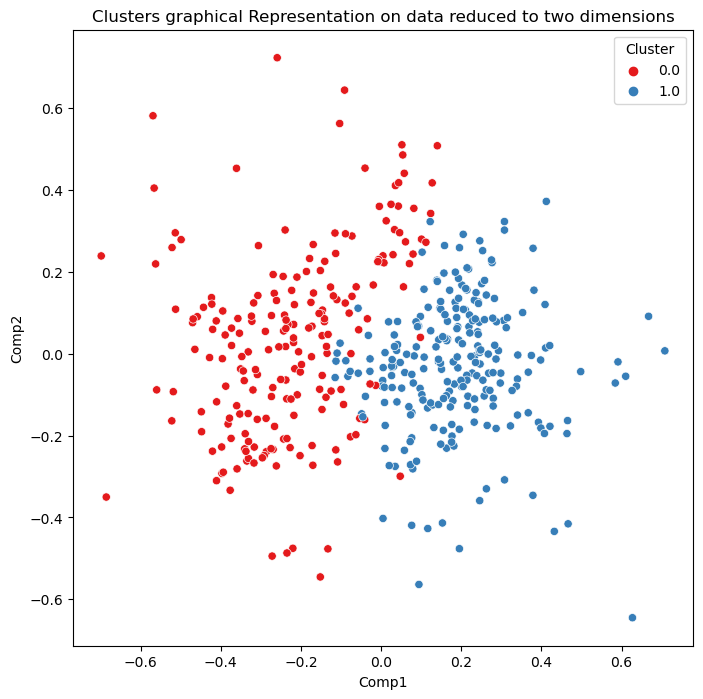

In [51]:
pca=PCA(n_components=2)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, y_hc_w2]), columns=['Comp1','Comp2', 'Cluster'])

plt.figure(figsize=(8,8))
sns.scatterplot(data=reduced, hue='Cluster', x='Comp1',y='Comp2', palette='Set1')
plt.title('Clusters graphical Representation on data reduced to two dimensions',  fontsize=12)
plt.show()

#### 5. KMeans(n_clusters=4) + PCA(n_components=4)

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



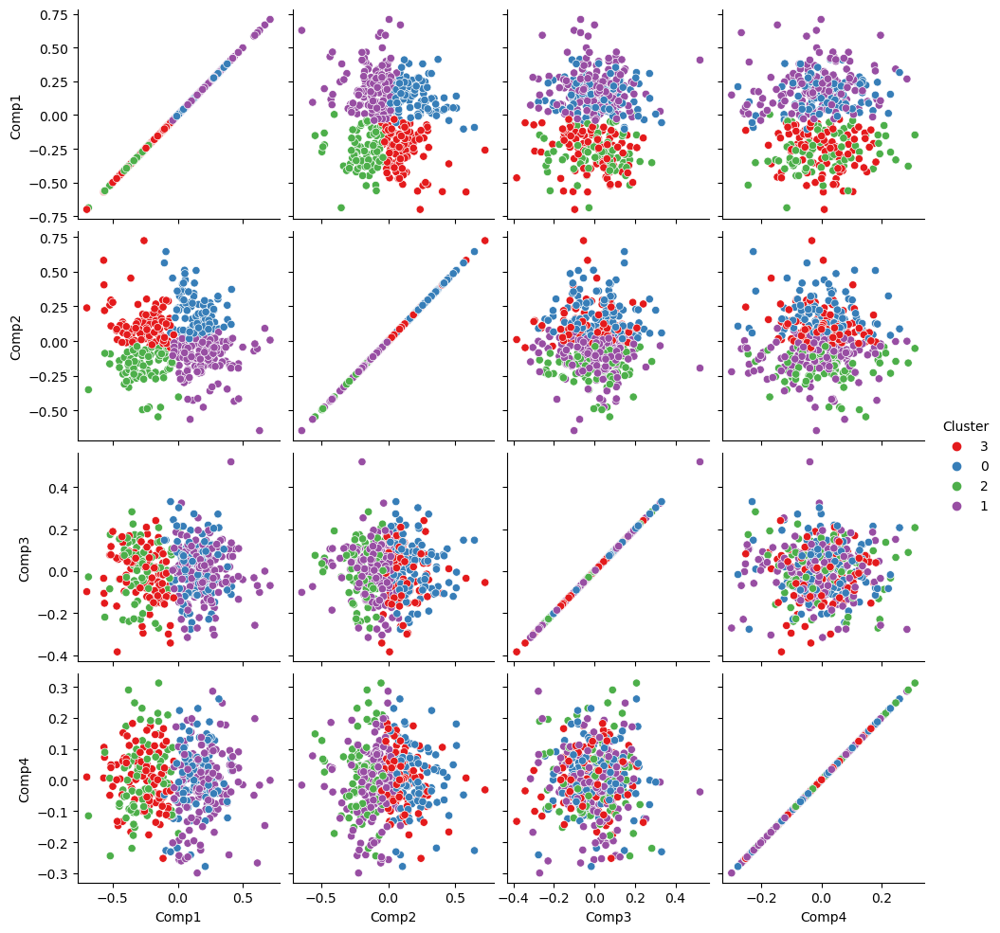

In [52]:
pca=PCA(n_components=4)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, X_y_kmeans4.Cluster]), columns=['Comp1','Comp2','Comp3','Comp4','Cluster'])

sns.pairplot(reduced, hue='Cluster', diag_kind=None, vars=reduced.columns[0:-1], palette='Set1')
plt.show()

#### 6. KMeans(n_clusters=4) + PCA(n_components=2)

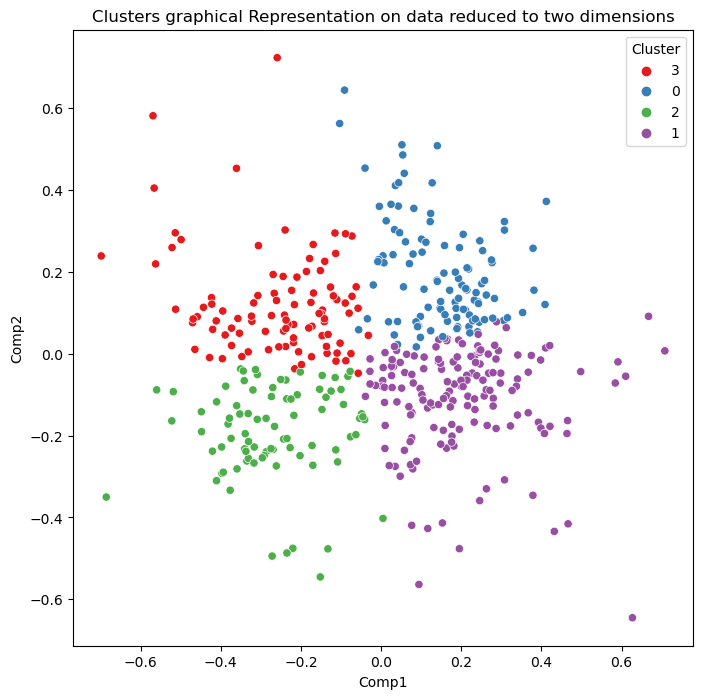

In [53]:
pca=PCA(n_components=2)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, X_y_kmeans4.Cluster]), columns=['Comp1','Comp2', 'Cluster'])

plt.figure(figsize=(8,8))
sns.scatterplot(data=reduced, hue='Cluster', x='Comp1',y='Comp2', palette='Set1')
plt.title('Clusters graphical Representation on data reduced to two dimensions',  fontsize=12)
plt.show()

#### 7. KMeans(n_clusters=2) + PCA(n_components=4)

/Users/jlo/anaconda3/envs/newenv/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



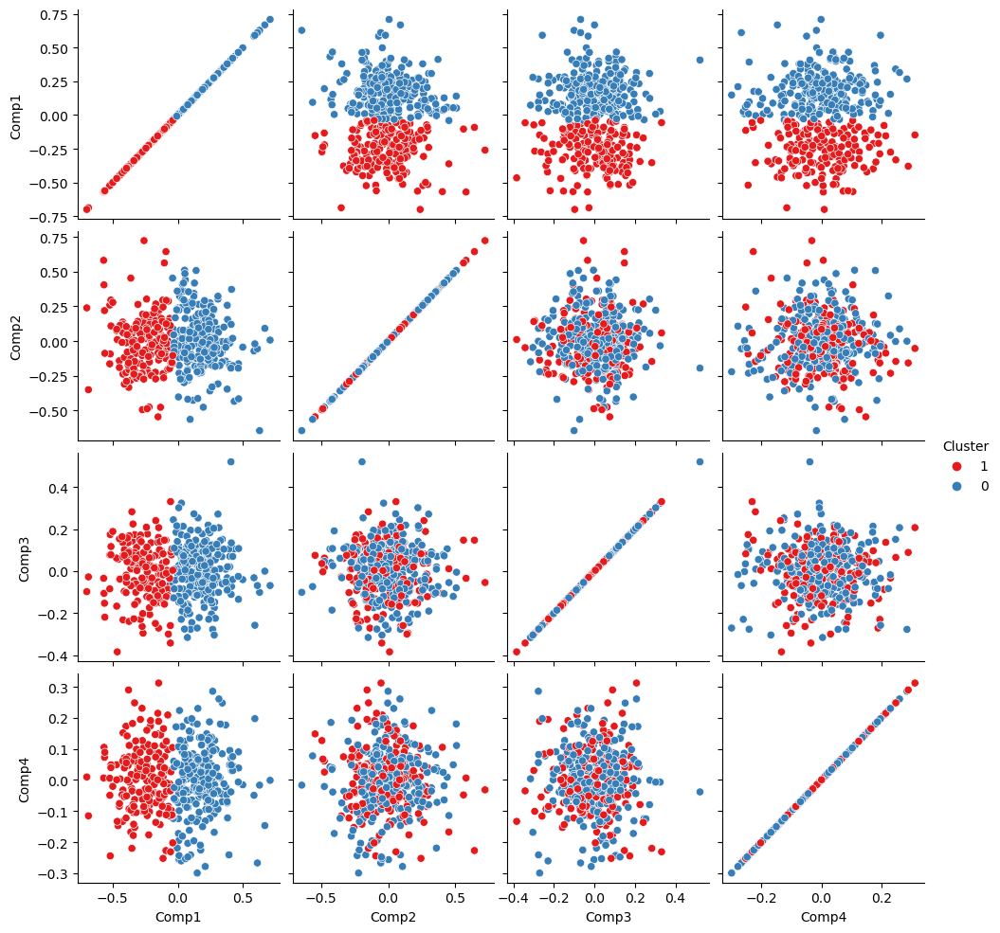

In [54]:
pca=PCA(n_components=4)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, X_y_kmeans2.Cluster]), columns=['Comp1','Comp2','Comp3','Comp4','Cluster'])

sns.pairplot(reduced, hue='Cluster', diag_kind=None, vars=reduced.columns[0:-1], palette='Set1')
plt.show()

#### 8. KMeans(n_clusters=2) + PCA(n_components=2)

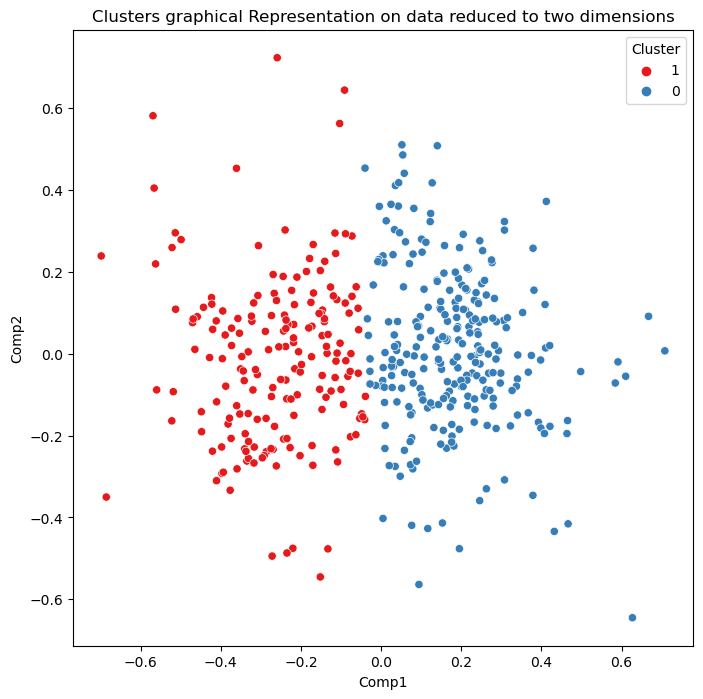

In [57]:
pca=PCA(n_components=2)
reduced=pca.fit_transform(X)

reduced=pd.DataFrame(np.column_stack([reduced, X_y_kmeans2.Cluster]), columns=['Comp1','Comp2', 'Cluster'])

plt.figure(figsize=(8,8))
sns.scatterplot(data=reduced, hue='Cluster', x='Comp1',y='Comp2', palette='Set1')
plt.title('Clusters graphical Representation on data reduced to two dimensions',  fontsize=12)
plt.show()

From a visual standpont, it appears that reducing our dimensions to 2 or 4 components and clustering using our K-means model with 2 or 4 clusters.  I'd say the most distinct separation can be seen when we reduce our dimensions to 2 components and using a K-means of 2.

# Part V - Conclusion

From the model you developed and the exploratory data analysis (EDA) conducted, generate four bullet points as your findings.

- We saw that the most correlated features were "Milk", "Grocery", and "Detergents_Paper" with a correlation of:
    - 0.92 for "Grocery" and "Detergents_Paper"
    - 0.73 for "Milk" and "Grocery"
    - 0.66 for "Milk" and "Detergents_Paper"
- By combining both K-means and Hierarchical Clustering methods, we were able to deduce that 2 - 4 clusters was an appropriate choice.  K-means particularly yeilded an elbow at k=2, whereas Hierarchical methods showed some promise for that 2 - 4 cluster range.
- Using PCA we discovered that at least 70% of explained variability is reached when we reduced our dimensionality to 2 components, and 90% of explained variability was reached when we used 4 components. In other words, the data might inherently lie in a lower-dimensional space, and the first two principal components retain the most essential information about the variability in the data.
- The clearest separation was seen when reducing our dimensions to 2 and clustering into 2 groups.  The fact that a small number of principal components and clusters provide a clear separation implies that the original features may have some level of redundancy or correlation. The principal components and clusters offer a more concise and interpretable representation of the data.